# Check data availibility AVHRR

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
# sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
# sys.path.insert(1, '/home/lalandmi/Dropbox/Thèse/notebooks/utils') # to include my util file in previous directory
sys.path.insert(1, '../utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]


In [2]:
path = '/home/lalandmi/Dropbox/data/ESA_CCI_SNOW/preprocess/scfg/AVHRR_MERGED/v2.0/monthly/'
period = slice('2005','2008')

In [3]:
# For parallelisation
from dask.distributed import Client
client = Client(n_workers=8, threads_per_worker=1, memory_limit='4GB')
# client = Client()
client

Client Scheduler: tcp://127.0.0.1:36109 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 8 Cores: 8 Memory: 32.00 GB


In [172]:
client.close()

In [4]:
ds = xr.open_mfdataset(path+'*.nc', parallel=True, chunks={'lon': 1800, 'lat': 1800}).sel(time=period)
ds

<xarray.Dataset>
Dimensions:          (lat: 3600, lon: 7200, time: 48)
Coordinates:
  * lat              (lat) float64 -89.97 -89.92 -89.88 ... 89.88 89.92 89.97
  * lon              (lon) float64 -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
  * time             (time) datetime64[ns] 2005-01-31 2005-02-28 ... 2008-12-31
Data variables:
    scfg_interp      (time, lat, lon) float64 dask.array<chunksize=(12, 1800, 1800), meta=np.ndarray>
    coverage         (time, lat, lon) float64 dask.array<chunksize=(12, 1800, 1800), meta=np.ndarray>
    coverage_interp  (time, lat, lon) float64 dask.array<chunksize=(12, 1800, 1800), meta=np.ndarray>
    mask_ice         (time, lat, lon) float32 dask.array<chunksize=(12, 1800, 1800), meta=np.ndarray>
    mask_water       (time, lat, lon) float32 dask.array<chunksize=(12, 1800, 1800), meta=np.ndarray>
Attributes:
    processed:                  A linear interpolation on the time dimension ...
    title:                      ESA CCI snow on ground product level L3C dail...
    institution:                Remote Sensing Research Group, Institute of G...
    source:                     AVHRR_NOAA-7_GAC mosaic from ESA Cloud CCI pr...
    date_created:               20211109T162200Z
    history:                    20211109T162200Z: ESA snow_cci SCF processing...
    references:                 http://snow-cci.enveo.at/
    tracking_id:                afb79860-80e9-43f0-9a4c-d798cc7845d5
    Conventions:                CF-1.9
    product_version:            2.0
    format_version:             CCI Data Standards v2.3
    summary:                    The SCFG product provides daily information o...
    keywords:                   snow, cover, AVHRR
    id:                         19820101-ESACCI-L3C_SNOW-SCFG-AVHRR_MERGED-fv...
    naming_authority:           ch.unibe
    keywords_vocabulary:        NASA Global Change Master Directory (GCMD) Sc...
    cdm_data_type:              Grid
    comment:                    The following auxiliary data sets are used fo...
    creator_name:               Remote Sensing Research Group
    creator_url:                http://giub.unibe.ch
    creator_email:              snow_CCI_AVHRR@giub.unibe.ch
    project:                    Climate Change Initiative - European Space Ag...
    geospatial_lat_min:         -90
    geospatial_lat_max:         90
    geospatial_lon_min:         -180
    geospatial_lon_max:         180
    geospatial_vertical_min:    0
    geospatial_vertical_max:    0
    geospatial_lon_resolution:  0.05
    geospatial_lat_resolution:  0.05
    geospatial_lat_units:       degrees_north
    geospatial_lon_units:       degrees_east
    time_coverage_start:        19820101T000000Z
    time_coverage_end:          19820101T235959Z
    time_coverage_duration:     P1D
    time_coverage_resolution:   P1D
    standard_name_vocabulary:   CF Standard Name Table v78
    license:                    ESA CCI Data Policy: free and open access
    platform:                   NOAA-7
    sensor:                     AVHRR
    spatial_resolution:         0.05 degree
    key_variables:              scfg
    doi:                        10.5285/3f034f4a08854eb59d58e1fa92d207b6

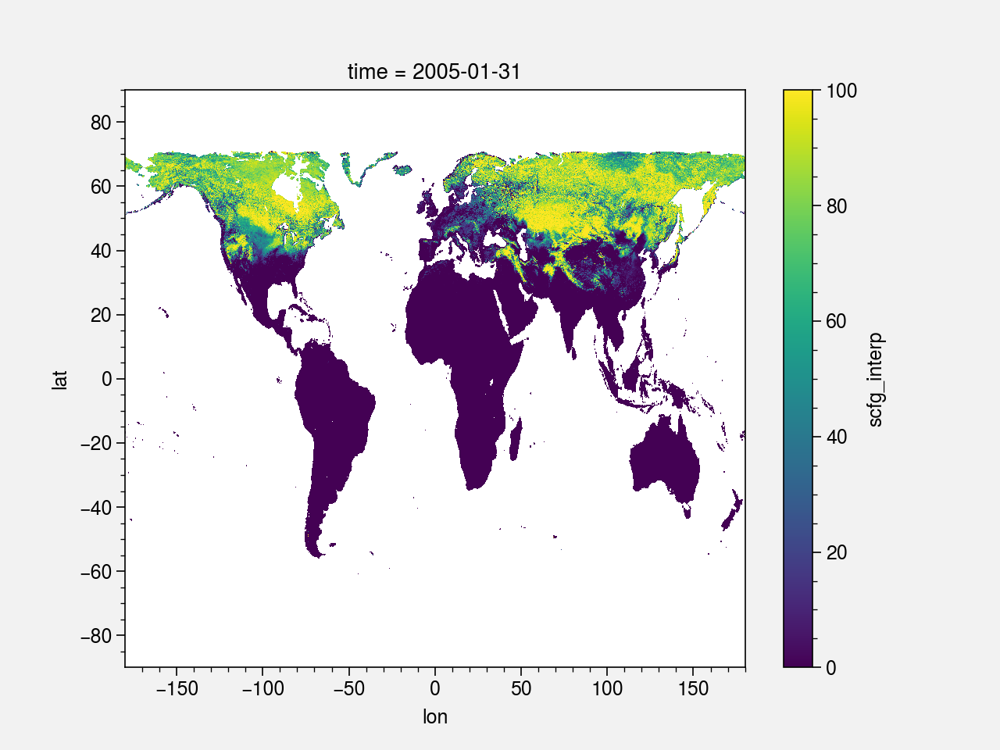

In [23]:
ds.scfg_interp[0].plot()

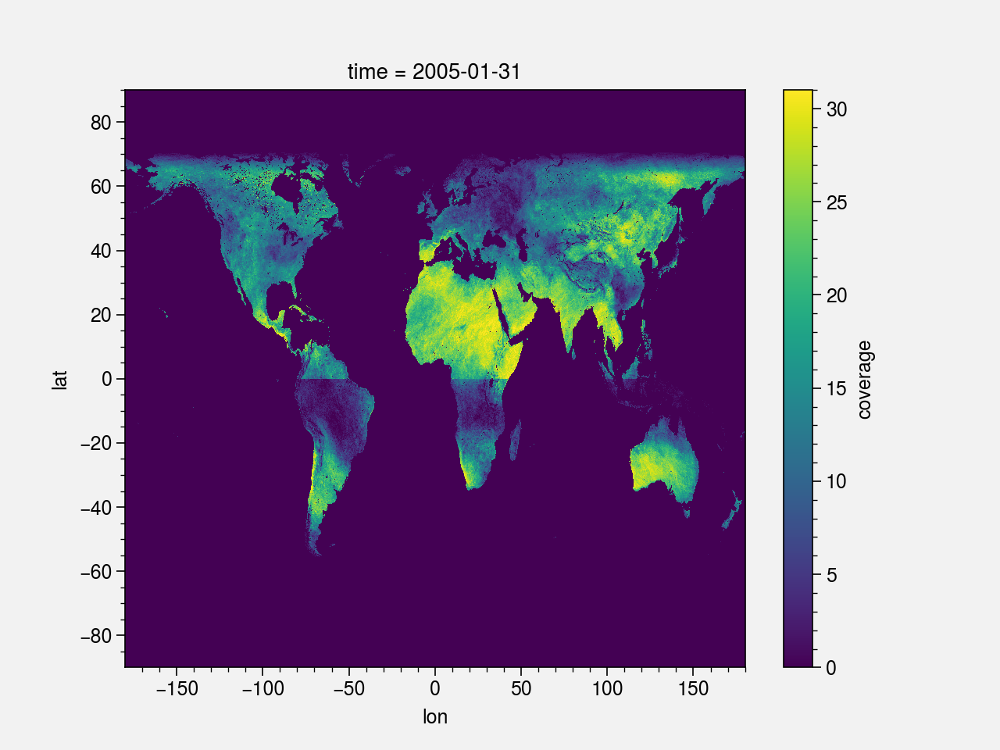

In [20]:
ds.coverage[0].plot()

In [108]:
# Zones
latlim_SA = slice(-60, -10); lonlim_SA = slice(-80, -60)
latlim_US = slice(20, 70); lonlim_US = slice(-165, -85)
latlim_EU = slice(30, 80); lonlim_EU = slice(0, 20)
latlim_HMA = slice(20, 55); lonlim_HMA = slice(60, 116)

In [109]:
coverage_all = ds.coverage.sum('time').where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ) / \
                    (pd.to_datetime(str(int(period.stop)+1)) - pd.to_datetime(period.start)).days * 100
coverage_all.load()

<xarray.DataArray 'coverage' (lat: 3600, lon: 7200)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lat      (lat) float64 -89.97 -89.92 -89.88 -89.83 ... 89.88 89.92 89.97
  * lon      (lon) float64 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0
    time     datetime64[ns] 2005-01-31

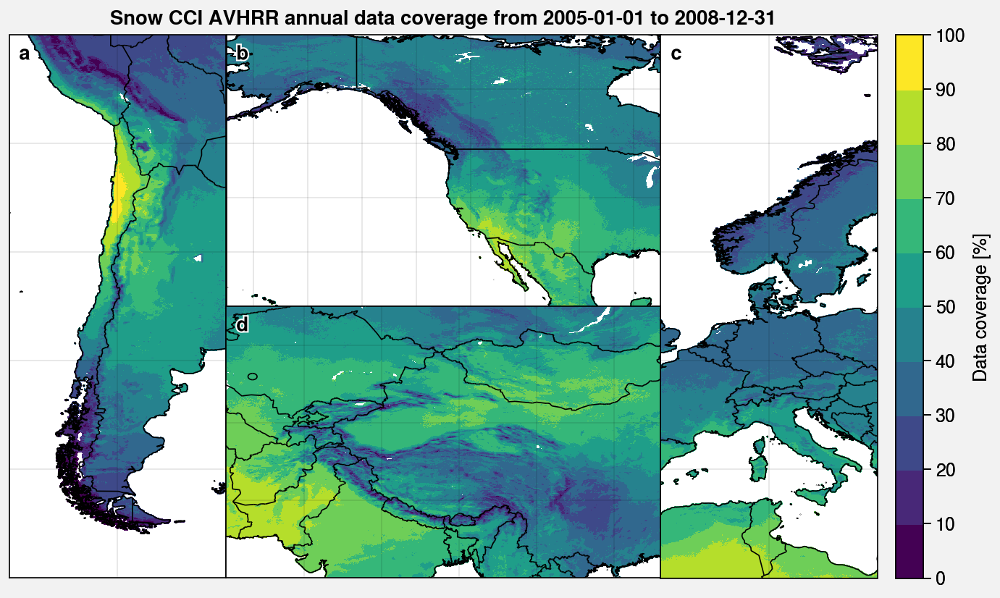

In [110]:
fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

da = coverage_all
cmap = 'viridis'
levels = plot.arange(0, 100, 10)

m = axs[0].pcolormesh(da.sel(lat=latlim_SA, lon=lonlim_SA), cmap=cmap, levels=levels)
axs[0].format(latlim=(latlim_SA.start, latlim_SA.stop), lonlim=(lonlim_SA.start, lonlim_SA.stop))

axs[1].pcolormesh(da.sel(lat=latlim_US, lon=lonlim_US), cmap=cmap, levels=levels)
axs[1].format(latlim=(latlim_US.start, latlim_US.stop), lonlim=(lonlim_US.start, lonlim_US.stop))

axs[2].pcolormesh(da.sel(lat=latlim_EU, lon=lonlim_EU), cmap=cmap, levels=levels)
axs[2].format(latlim=(latlim_EU.start, latlim_EU.stop), lonlim=(lonlim_EU.start, lonlim_EU.stop))

axs[3].pcolormesh(da.sel(lat=latlim_HMA, lon=lonlim_HMA), cmap=cmap, levels=levels)
axs[3].format(latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop))

fig.colorbar(m, label='Data coverage [%]', ticks=10)

axs.format(
    lonlines=10, latlines=10,
    suptitle='Snow CCI AVHRR annual data coverage from '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
    coast=True, borders=True,
#     ocean=True, oceancolor='pale blue',
    abc=True, abcloc='ul', reso='hi'
)

fig.save('img/snowCCI_AVHRR_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

In [111]:
coverage_interp_all = ds.coverage_interp.sum('time').where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ) / \
                    (pd.to_datetime(str(int(period.stop)+1)) - pd.to_datetime(period.start)).days * 100
coverage_interp_all.load()

<xarray.DataArray 'coverage_interp' (lat: 3600, lon: 7200)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * lat      (lat) float64 -89.97 -89.92 -89.88 -89.83 ... 89.88 89.92 89.97
  * lon      (lon) float64 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0
    time     datetime64[ns] 2005-01-31

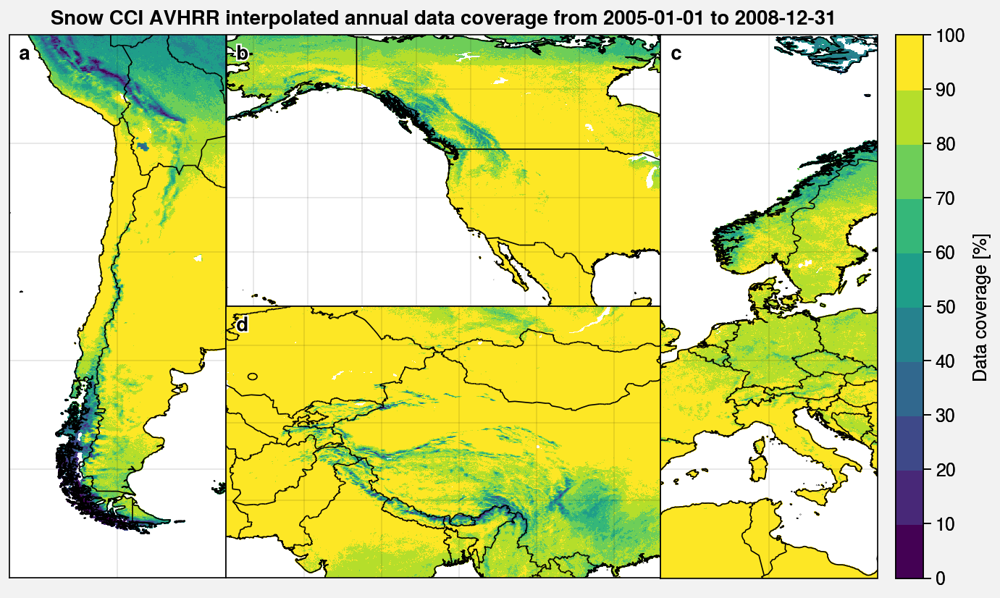

In [112]:
fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

da = coverage_interp_all
cmap = 'viridis'
levels = plot.arange(0, 100, 10)

m = axs[0].pcolormesh(da.sel(lat=latlim_SA, lon=lonlim_SA), cmap=cmap, levels=levels)
axs[0].format(latlim=(latlim_SA.start, latlim_SA.stop), lonlim=(lonlim_SA.start, lonlim_SA.stop))

axs[1].pcolormesh(da.sel(lat=latlim_US, lon=lonlim_US), cmap=cmap, levels=levels)
axs[1].format(latlim=(latlim_US.start, latlim_US.stop), lonlim=(lonlim_US.start, lonlim_US.stop))

axs[2].pcolormesh(da.sel(lat=latlim_EU, lon=lonlim_EU), cmap=cmap, levels=levels)
axs[2].format(latlim=(latlim_EU.start, latlim_EU.stop), lonlim=(lonlim_EU.start, lonlim_EU.stop))

axs[3].pcolormesh(da.sel(lat=latlim_HMA, lon=lonlim_HMA), cmap=cmap, levels=levels)
axs[3].format(latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop))

fig.colorbar(m, label='Data coverage [%]', ticks=10)

axs.format(
    lonlines=10, latlines=10,
    suptitle='Snow CCI AVHRR interpolated annual data coverage from '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
    coast=True, borders=True,
#     ocean=True, oceancolor='pale blue',
    abc=True, abcloc='ul', reso='hi'
)

fig.save('img/snowCCI_AVHRR_interp_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

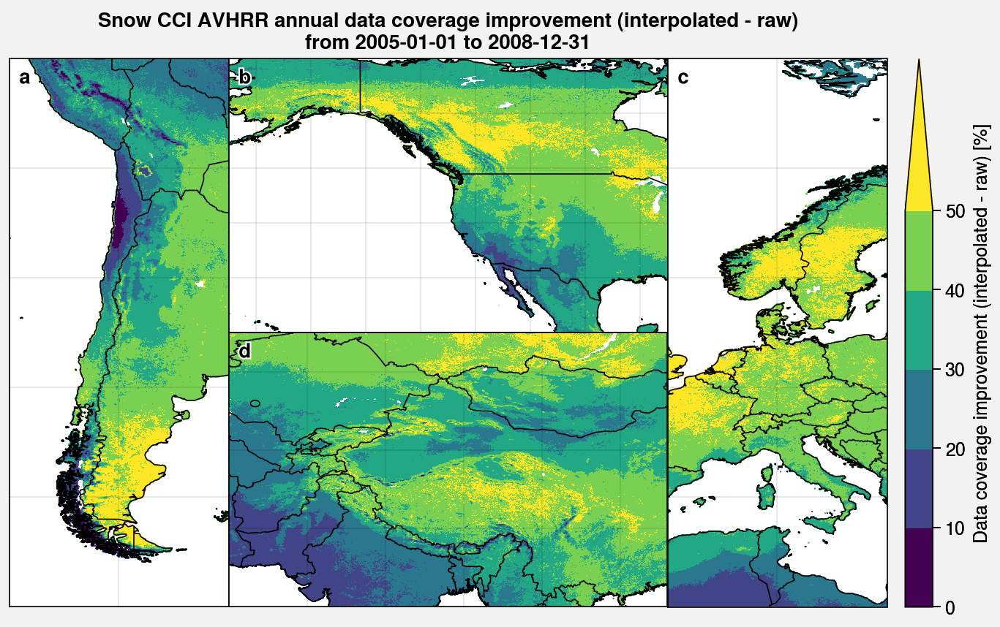

In [170]:
fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

da = coverage_interp_all - coverage_all
cmap = 'viridis'
levels = plot.arange(0, 50, 10)
extend = 'max'

m = axs[0].pcolormesh(da.sel(lat=latlim_SA, lon=lonlim_SA), cmap=cmap, levels=levels, extend=extend)
axs[0].format(latlim=(latlim_SA.start, latlim_SA.stop), lonlim=(lonlim_SA.start, lonlim_SA.stop))

axs[1].pcolormesh(da.sel(lat=latlim_US, lon=lonlim_US), cmap=cmap, levels=levels, extend=extend)
axs[1].format(latlim=(latlim_US.start, latlim_US.stop), lonlim=(lonlim_US.start, lonlim_US.stop))

axs[2].pcolormesh(da.sel(lat=latlim_EU, lon=lonlim_EU), cmap=cmap, levels=levels, extend=extend)
axs[2].format(latlim=(latlim_EU.start, latlim_EU.stop), lonlim=(lonlim_EU.start, lonlim_EU.stop))

axs[3].pcolormesh(da.sel(lat=latlim_HMA, lon=lonlim_HMA), cmap=cmap, levels=levels, extend=extend)
axs[3].format(latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop))

fig.colorbar(m, label='Data coverage improvement (interpolated - raw) [%]', ticks=10)

axs.format(
    lonlines=10, latlines=10,
    suptitle='Snow CCI AVHRR annual data coverage improvement (interpolated - raw)\nfrom '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
    coast=True, borders=True,
#     ocean=True, oceancolor='pale blue',
    abc=True, abcloc='ul', reso='hi'
)

fig.save('img/snowCCI_AVHRR_improv_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

## By seasons

In [104]:
ts = pd.date_range(pd.to_datetime(period.start), ds.time[-1].values, freq='D').to_series().resample('M').count()

n_days_seas = np.array([
    ts.where( (ts.index.month >= 9) & (ts.index.month <= 11) ).sum(),
    ts.where( (ts.index.month >= 12) | (ts.index.month <= 2) ).sum(),
    ts.where( (ts.index.month >= 3) & (ts.index.month <= 5) ).sum(),
    ts.where( (ts.index.month >= 6) & (ts.index.month <= 8) ).sum(),
])
n_days_seas

array([364., 361., 368., 368.])

In [100]:
coverage_seas = ds.coverage.groupby('time.season').sum('time').where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) )
coverage_seas.load()

coverage_interp_seas = ds.coverage_interp.groupby('time.season').sum('time').where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) )
coverage_interp_seas.load()

<xarray.DataArray 'coverage_interp' (season: 4, lat: 3600, lon: 7200)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * lat      (lat) float64 -89.97 -89.92 -89.88 -89.83 ... 89.88 89.92 89.97
  * lon      (lon) float64 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
    time     datetime64[ns] 2005-01-31

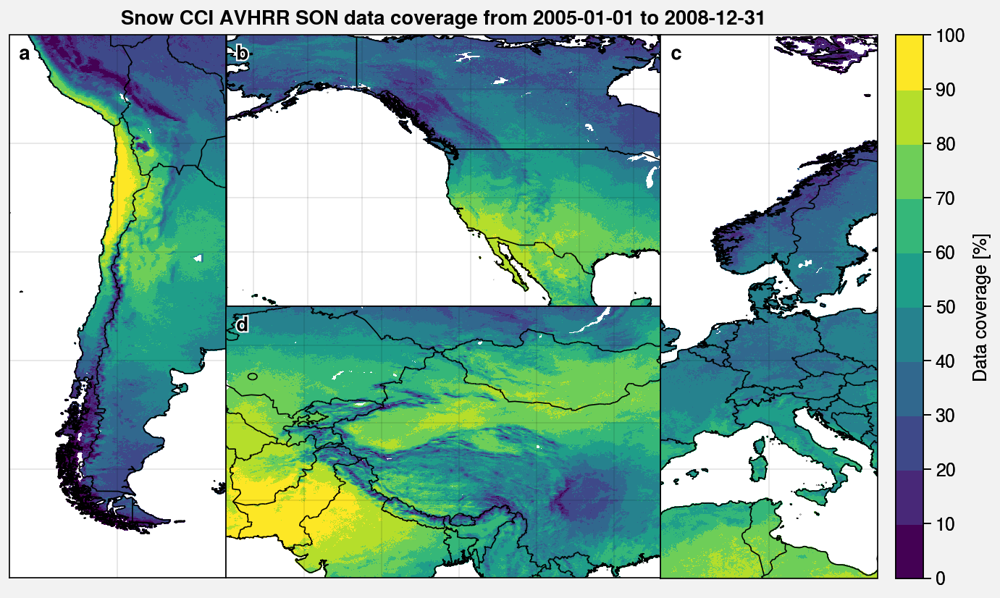

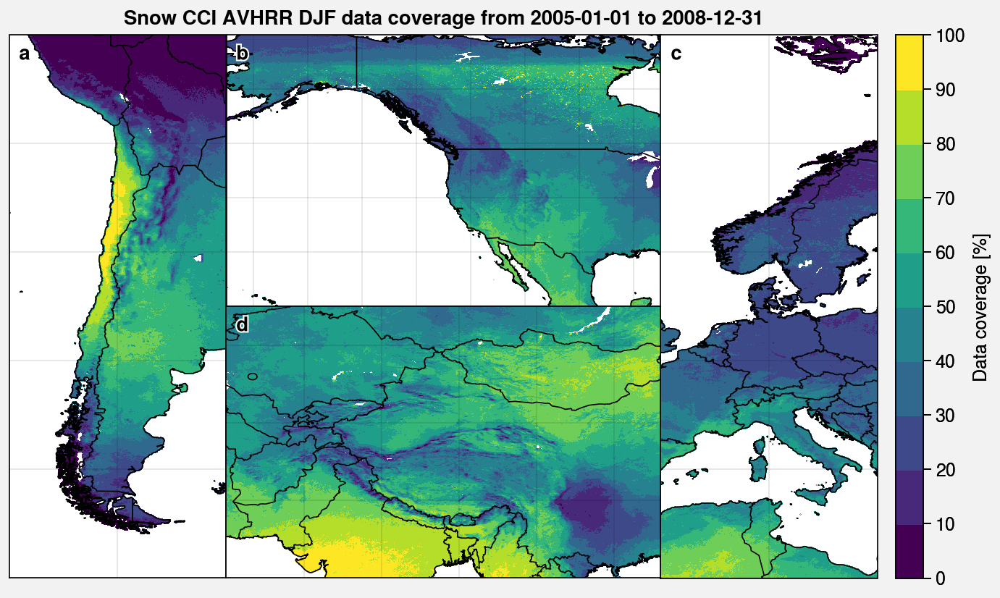

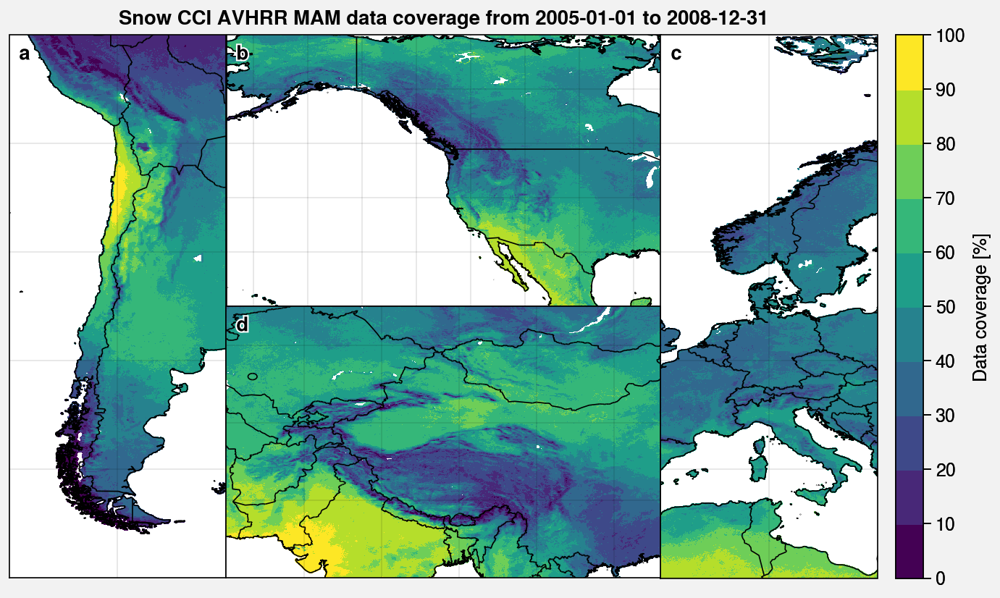

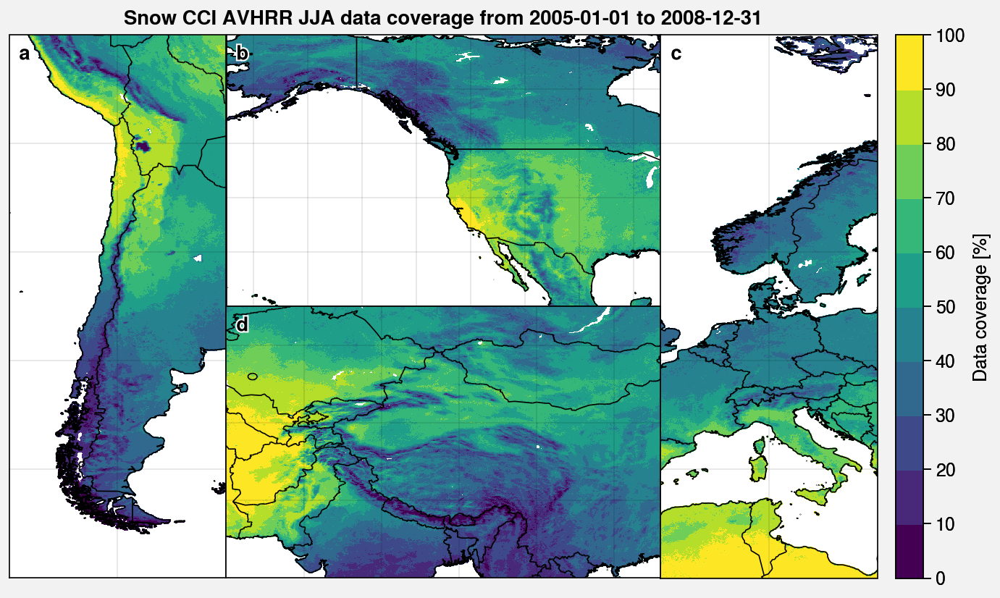

In [113]:
for i, season in enumerate(['SON', 'DJF', 'MAM', 'JJA']):

    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

    da = coverage_seas.sel(season=season) / n_days_seas[i] * 100
    cmap = 'viridis'
    levels = plot.arange(0, 100, 10)

    m = axs[0].pcolormesh(da.sel(lat=latlim_SA, lon=lonlim_SA), cmap=cmap, levels=levels)
    axs[0].format(latlim=(latlim_SA.start, latlim_SA.stop), lonlim=(lonlim_SA.start, lonlim_SA.stop))

    axs[1].pcolormesh(da.sel(lat=latlim_US, lon=lonlim_US), cmap=cmap, levels=levels)
    axs[1].format(latlim=(latlim_US.start, latlim_US.stop), lonlim=(lonlim_US.start, lonlim_US.stop))

    axs[2].pcolormesh(da.sel(lat=latlim_EU, lon=lonlim_EU), cmap=cmap, levels=levels)
    axs[2].format(latlim=(latlim_EU.start, latlim_EU.stop), lonlim=(lonlim_EU.start, lonlim_EU.stop))

    axs[3].pcolormesh(da.sel(lat=latlim_HMA, lon=lonlim_HMA), cmap=cmap, levels=levels)
    axs[3].format(latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop))

    fig.colorbar(m, label='Data coverage [%]', ticks=10)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='Snow CCI AVHRR '+season+' data coverage from '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )
    
    fig.save('img/snowCCI_AVHRR_'+season+'_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

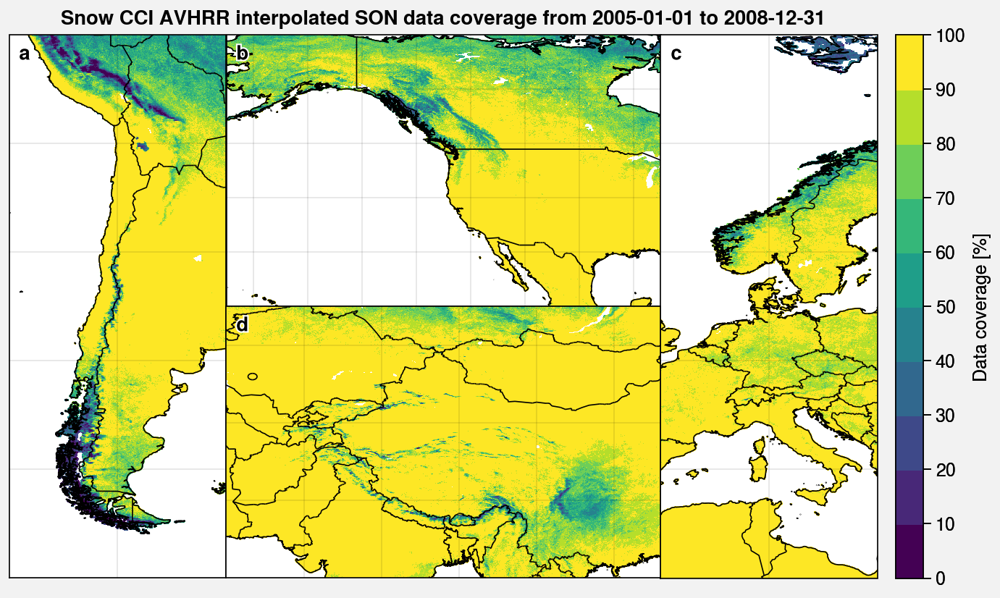

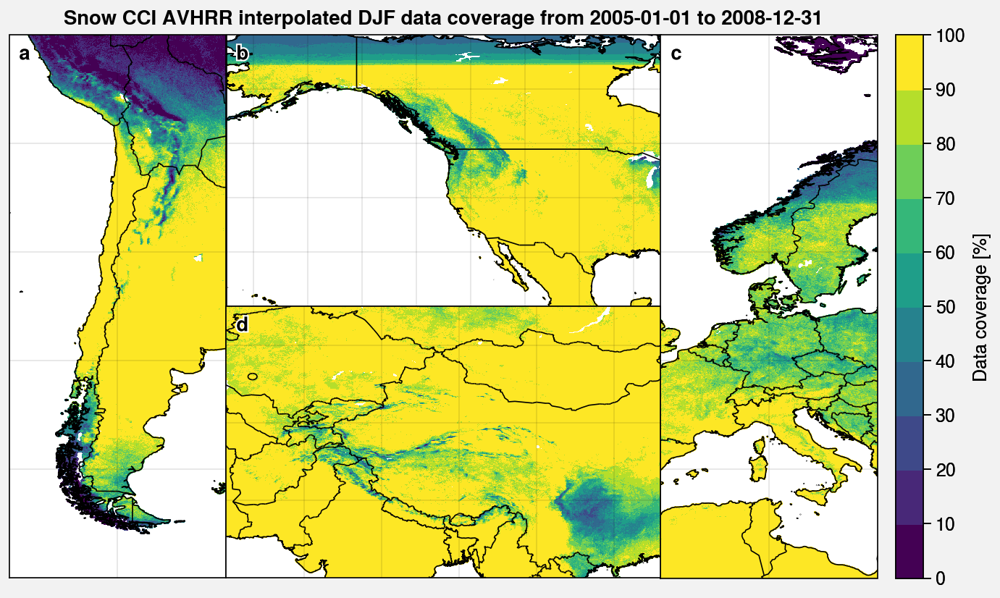

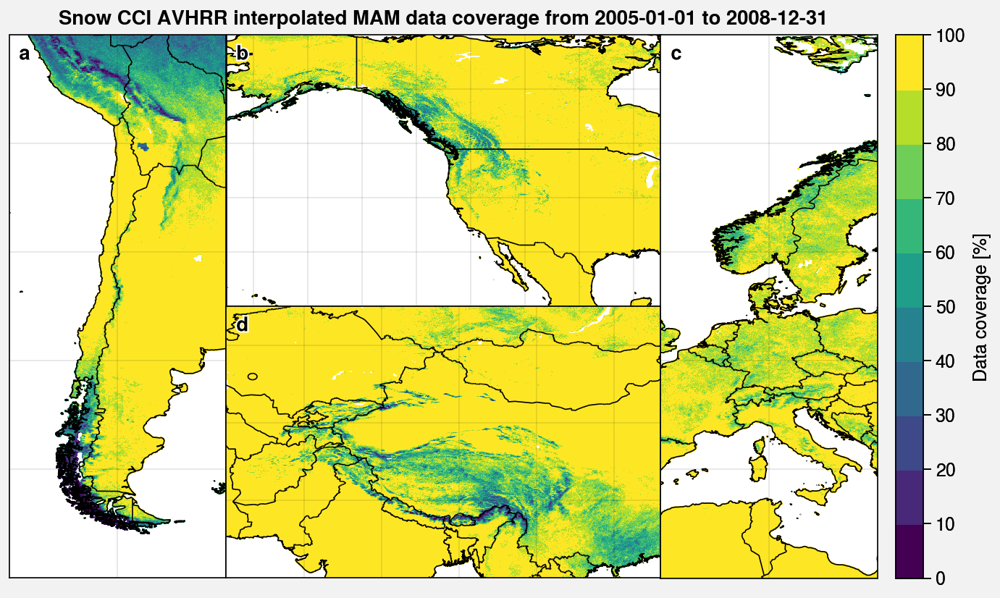

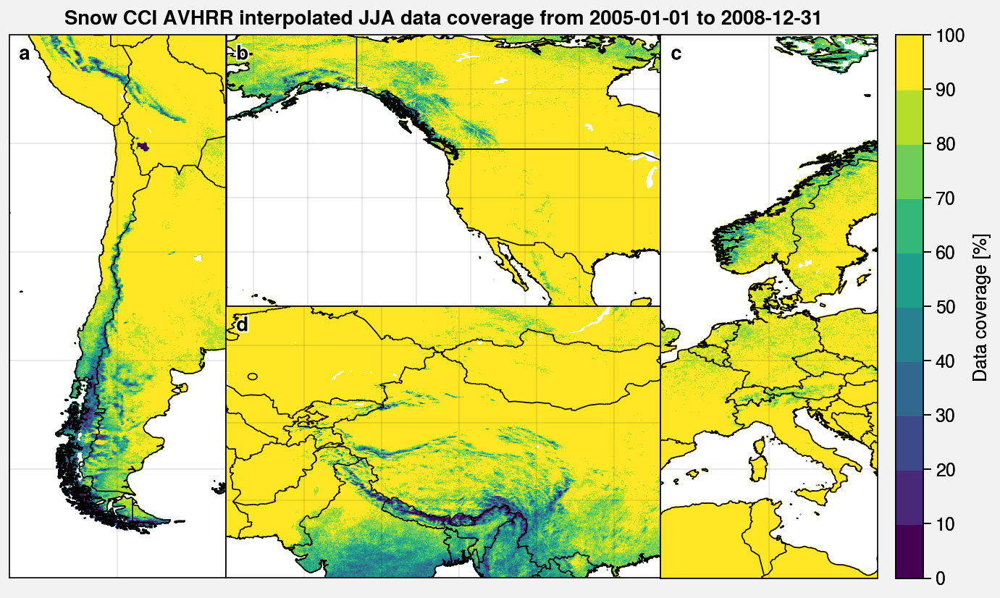

In [114]:
for i, season in enumerate(['SON', 'DJF', 'MAM', 'JJA']):

    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

    da = coverage_interp_seas.sel(season=season) / n_days_seas[i] * 100
    cmap = 'viridis'
    levels = plot.arange(0, 100, 10)

    m = axs[0].pcolormesh(da.sel(lat=latlim_SA, lon=lonlim_SA), cmap=cmap, levels=levels)
    axs[0].format(latlim=(latlim_SA.start, latlim_SA.stop), lonlim=(lonlim_SA.start, lonlim_SA.stop))

    axs[1].pcolormesh(da.sel(lat=latlim_US, lon=lonlim_US), cmap=cmap, levels=levels)
    axs[1].format(latlim=(latlim_US.start, latlim_US.stop), lonlim=(lonlim_US.start, lonlim_US.stop))

    axs[2].pcolormesh(da.sel(lat=latlim_EU, lon=lonlim_EU), cmap=cmap, levels=levels)
    axs[2].format(latlim=(latlim_EU.start, latlim_EU.stop), lonlim=(lonlim_EU.start, lonlim_EU.stop))

    axs[3].pcolormesh(da.sel(lat=latlim_HMA, lon=lonlim_HMA), cmap=cmap, levels=levels)
    axs[3].format(latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop))

    fig.colorbar(m, label='Data coverage [%]', ticks=10)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='Snow CCI AVHRR interpolated '+season+' data coverage from '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )
    
    fig.save('img/snowCCI_AVHRR_interp_'+season+'_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')    

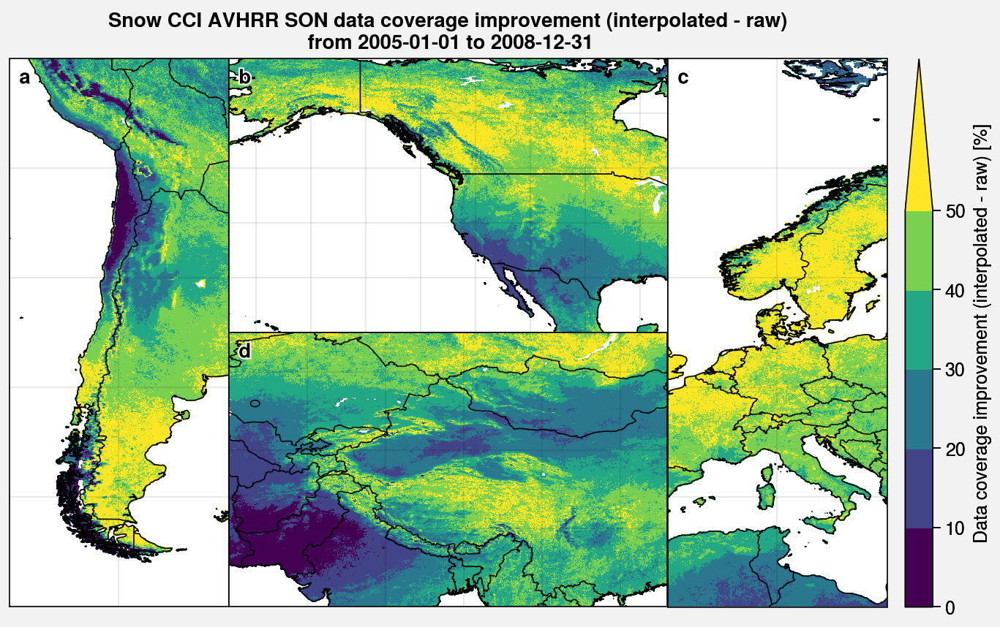

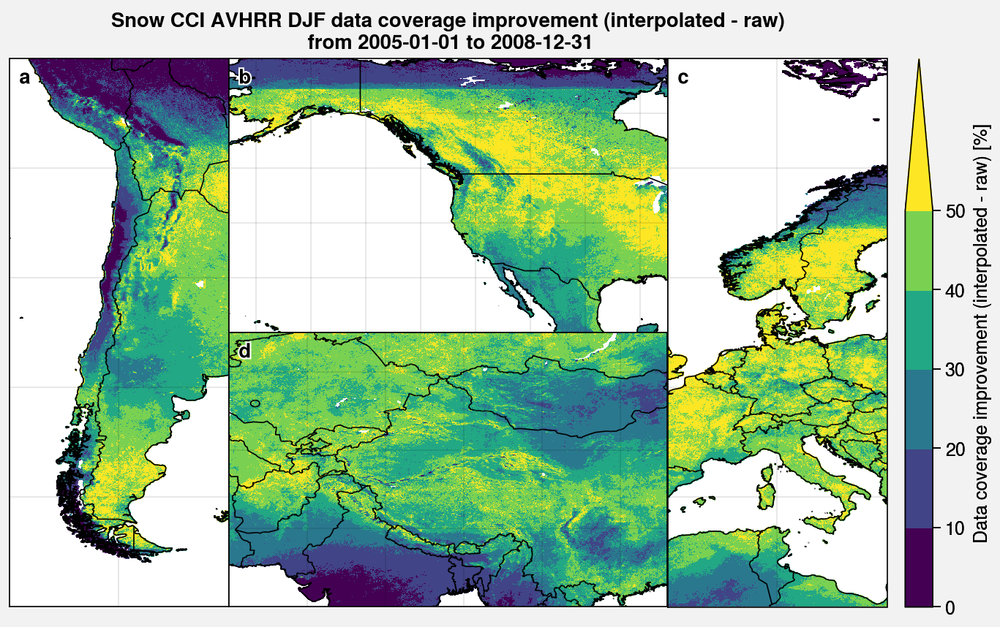

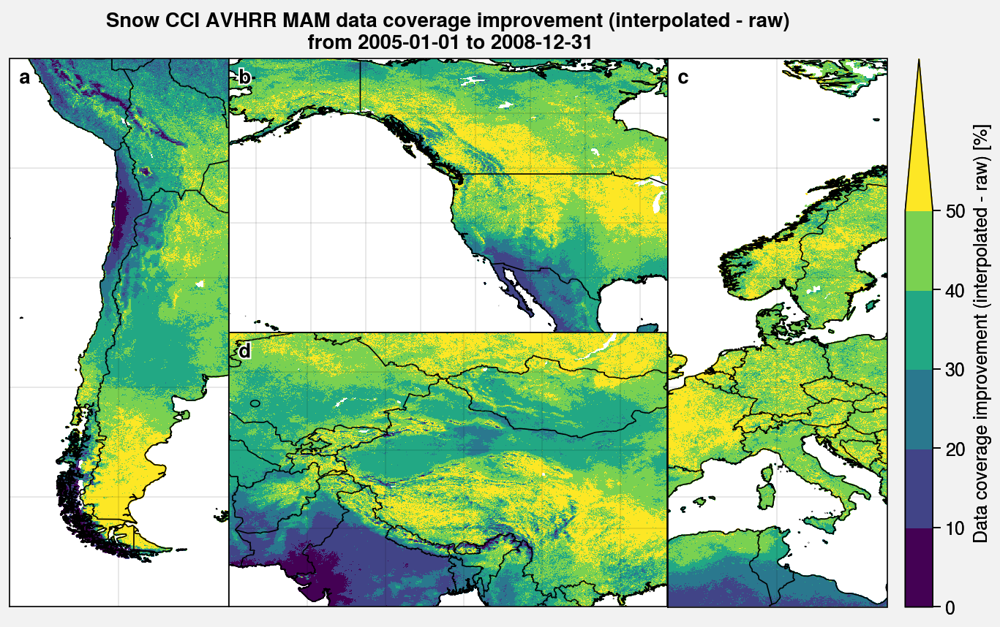

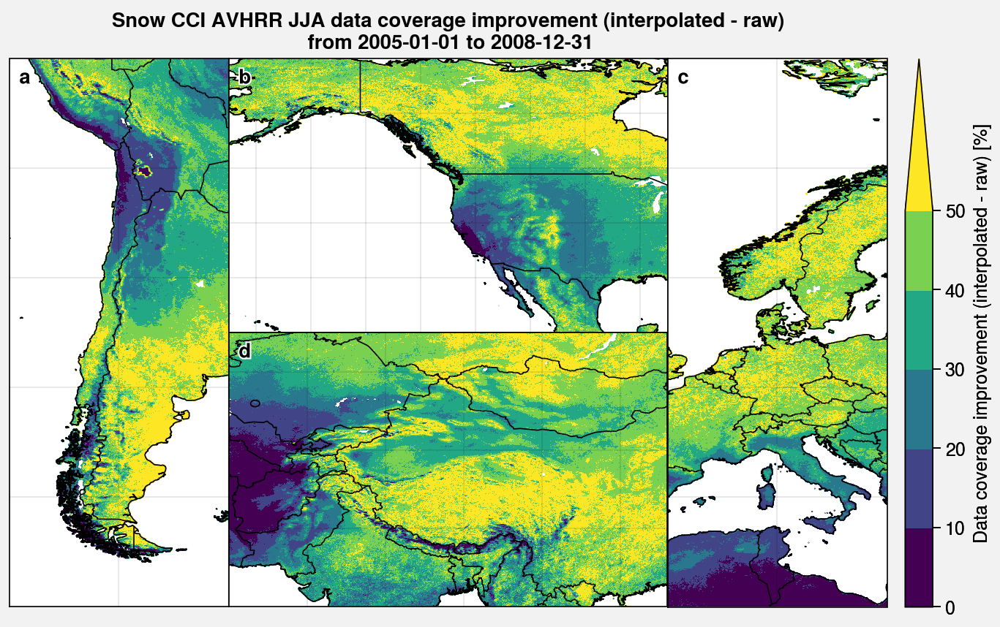

In [171]:
for i, season in enumerate(['SON', 'DJF', 'MAM', 'JJA']):

    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

    da = ( coverage_interp_seas.sel(season=season) - coverage_seas.sel(season=season) ) / n_days_seas[i] * 100
    cmap = 'viridis'
    levels = plot.arange(0, 50, 10)
    extend = 'max'

    m = axs[0].pcolormesh(da.sel(lat=latlim_SA, lon=lonlim_SA), cmap=cmap, levels=levels, extend=extend)
    axs[0].format(latlim=(latlim_SA.start, latlim_SA.stop), lonlim=(lonlim_SA.start, lonlim_SA.stop))

    axs[1].pcolormesh(da.sel(lat=latlim_US, lon=lonlim_US), cmap=cmap, levels=levels, extend=extend)
    axs[1].format(latlim=(latlim_US.start, latlim_US.stop), lonlim=(lonlim_US.start, lonlim_US.stop))

    axs[2].pcolormesh(da.sel(lat=latlim_EU, lon=lonlim_EU), cmap=cmap, levels=levels, extend=extend)
    axs[2].format(latlim=(latlim_EU.start, latlim_EU.stop), lonlim=(lonlim_EU.start, lonlim_EU.stop))

    axs[3].pcolormesh(da.sel(lat=latlim_HMA, lon=lonlim_HMA), cmap=cmap, levels=levels, extend=extend)
    axs[3].format(latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop))

    fig.colorbar(m, label='Data coverage improvement (interpolated - raw) [%]', ticks=10)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='Snow CCI AVHRR '+season+' data coverage improvement (interpolated - raw)\n from '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )
    
    fig.save('img/snowCCI_AVHRR_improv_'+season+'_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg') 

# Time series

In [5]:
ts_coverage = (u.spatial_average(ds.coverage.where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ))).load()
ts_coverage

<xarray.DataArray (time: 48)>
array([14.84824428, 14.29859266, 15.53857587, 15.43405438, 15.77421362,
       15.82138737, 16.82953334, 16.42714256, 16.85188949, 16.31726949,
       14.86675212, 14.94937962, 14.97894971, 13.94738079, 15.88426738,
       15.14886997, 16.12094846, 17.08019642, 17.48845   , 17.4430969 ,
       16.81071264, 15.48155155, 15.18774883, 14.44723738, 15.47625063,
       15.07730001, 16.46982253, 15.28309327, 16.48335677, 16.51267121,
       17.30371626, 17.30227196, 16.89494244, 16.1809869 , 15.59367349,
       14.80673295, 14.75898855, 15.52491051, 16.3241134 , 15.87054456,
       16.00511531, 16.24705301, 17.45960703, 17.26470002, 16.35932252,
       15.84242669, 14.90349534, 14.97189983])
Coordinates:
  * time     (time) datetime64[ns] 2005-01-31 2005-02-28 ... 2008-12-31

In [115]:
ts_coverage = ds.coverage.where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100
ts_coverage_interp = ds.coverage_interp.where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100

ts_coverage_SA = ds.coverage.sel(lat=latlim_SA, lon=lonlim_SA).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100
ts_coverage_interp_SA = ds.coverage_interp.sel(lat=latlim_SA, lon=lonlim_SA).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100

ts_coverage_US = ds.coverage.sel(lat=latlim_US, lon=lonlim_US).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100
ts_coverage_interp_US = ds.coverage_interp.sel(lat=latlim_US, lon=lonlim_US).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100

ts_coverage_EU = ds.coverage.sel(lat=latlim_EU, lon=lonlim_EU).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100
ts_coverage_interp_EU = ds.coverage_interp.sel(lat=latlim_EU, lon=lonlim_EU).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100

ts_coverage_HMA = ds.coverage.sel(lat=latlim_HMA, lon=lonlim_HMA).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100
ts_coverage_interp_HMA = ds.coverage_interp.sel(lat=latlim_HMA, lon=lonlim_HMA).where( (ds.mask_water[0] != 210) & (ds.mask_ice[0] != 215) ).weighted(np.cos(np.deg2rad(ds.lat))).mean(('lat', 'lon')).load() / ds.time.dt.day * 100

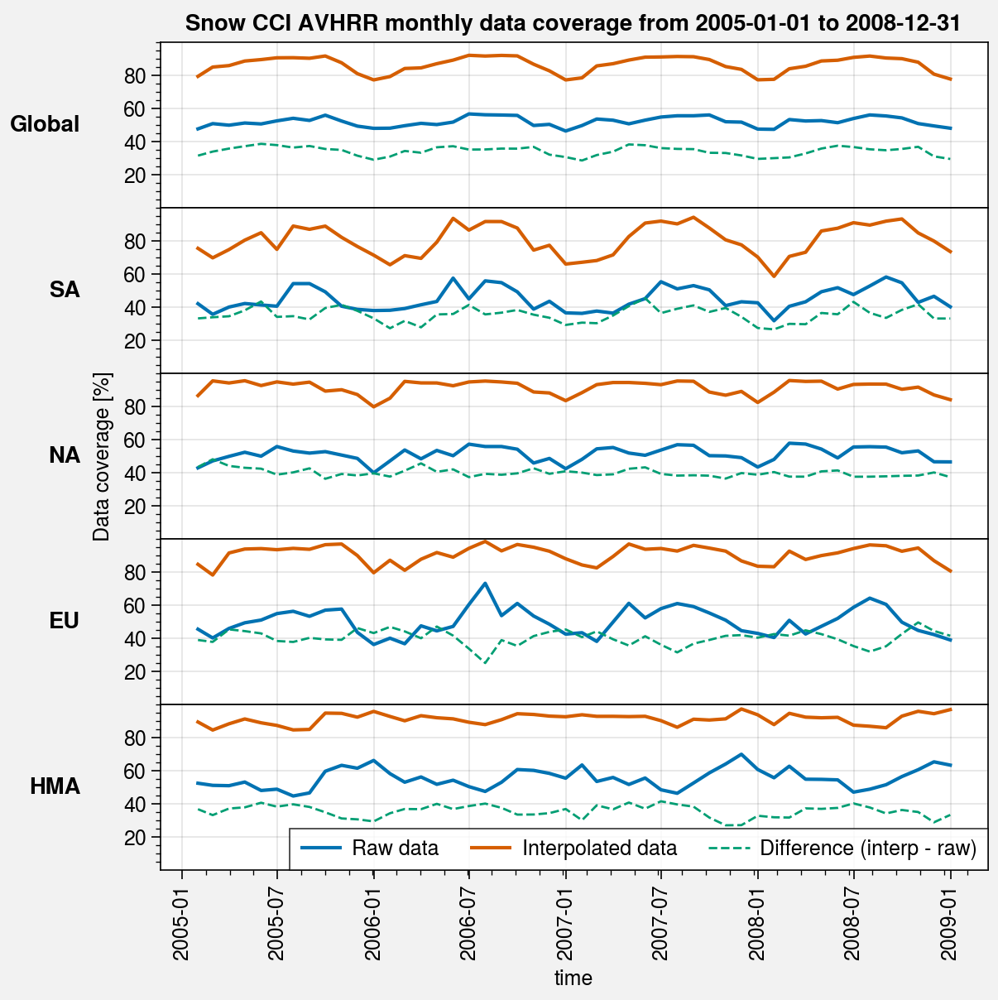

In [151]:
fig, axs = plot.subplots(nrows=5, aspect=5, axwidth=5, space=0)

axs[0].plot(ts_coverage)
axs[0].plot(ts_coverage_interp)
axs[0].plot(ts_coverage_interp - ts_coverage, lw=1, ls='--')

axs[1].plot(ts_coverage_SA)
axs[1].plot(ts_coverage_interp_SA)
axs[1].plot(ts_coverage_interp_SA - ts_coverage_SA, lw=1, ls='--')

axs[2].plot(ts_coverage_US)
axs[2].plot(ts_coverage_interp_US)
axs[2].plot(ts_coverage_interp_US - ts_coverage_US, lw=1, ls='--')

axs[3].plot(ts_coverage_EU)
axs[3].plot(ts_coverage_interp_EU)
axs[3].plot(ts_coverage_interp_EU - ts_coverage_EU, lw=1, ls='--')

axs[4].plot(ts_coverage_HMA, label='Raw data')
axs[4].plot(ts_coverage_interp_HMA, label='Interpolated data')
axs[4].plot(ts_coverage_interp_HMA - ts_coverage_HMA, lw=1, ls='--', label='Difference (interp - raw)')
axs[4].legend(loc='lr')

axs.format(
    ylim=(0,100), yticks=[20, 40, 60, 80], ylabel='Data coverage [%]',
    suptitle='Snow CCI AVHRR monthly data coverage from '+str(pd.to_datetime(period.start))[:10]+ ' to '+str(ds.time[-1].values)[:10],
    rowlabels=['Global', 'SA', 'NA', 'EU', 'HMA'],
)
    
fig.save('img/snowCCI_AVHRR_monthly_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')  